In [1]:
import os
import pickle
from glob import glob
from copy import deepcopy
import warnings
import datetime
import json

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from scipy import signal

import obspy
from obspy.core import UTCDateTime
from obspy.signal.filter import envelope
from obspy.signal.invsim import paz_to_freq_resp

import changefinder

from configure import *

# Setteings
warnings.simplefilter('ignore')
# plt.rcParams['figure.figsize'] = (24, 4)

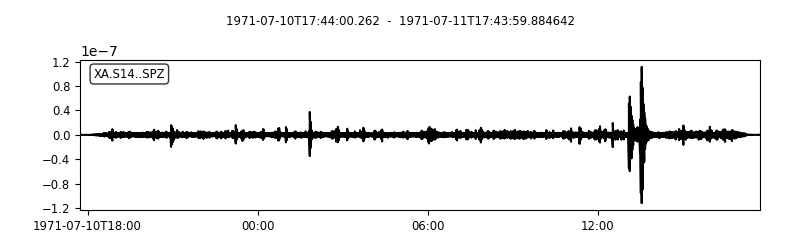

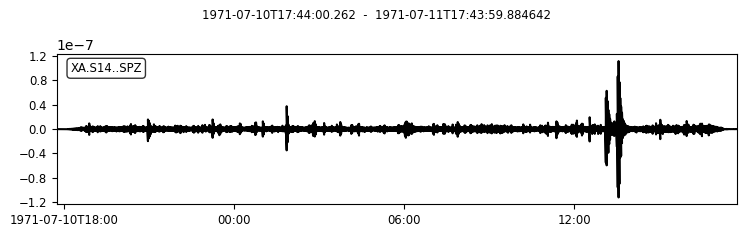

In [9]:
import pickle

# path = '/Users/imagawa/Desktop/実験データ/HFT_plots/plots_2022-06-14/envelope/pickle/p14s/pse.a14.01.071.pickle'
path = '/Users/imagawa/Desktop/実験データ/HFT_plots/plots_2022-06-14/envelope/pickle/p14s/pse.a14.01.156.pickle'
# path = '/Users/imagawa/Desktop/実験データ/HFT_plots/plots_2022-06-14/envelope/pickle/p14s/pse.a14.04.059.pickle'
# path = '/Users/imagawa/Desktop/実験データ/HFT_plots/plots_2022-06-14/envelope/pickle/p14s/pse.a14.05.154.pickle'
# path = '/Users/imagawa/Desktop/実験データ/HFT_plots/plots_2022-06-14/envelope/pickle/p14s/pse.a14.07.055.pickle'
with open(path, 'rb') as file:
    smq = pickle.load(file)

# %matplotlib widget
smq.spz.plot()

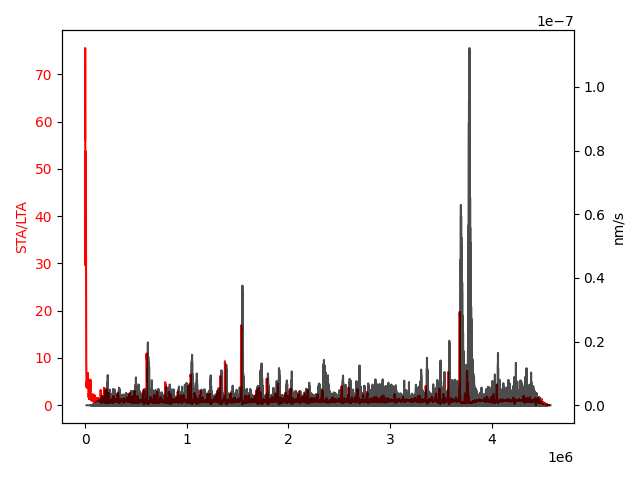

In [11]:
# copy data
aaa = deepcopy(smq.spz[0].data)
# aaa = deepcopy(smq.lpx[0].data)
aaa = pd.Series(aaa).abs()


# calculate sta and lta
is_sp = True
# is_sp = False

if is_sp:
    tl, ts, lag = 7950, 2650, 2968
else:
    tl, ts, lag = 990, 330, 370

sta, lta = aaa.rolling(ts).mean(), aaa.rolling(tl).mean()
sta, lta = sta[~pd.isnull(sta)], lta[~pd.isnull(lta)]

sta = sta[tl+lag:]
lta = lta[:sta.shape[0]]

sta, lta = np.array(sta), np.array(lta)


# plot data
%matplotlib widget
fig, ax1 = plt.subplots()
# fig, ax1 = plt.subplots(figsize=(24, 4))

color = 'red'
ax1.set_ylabel('STA/LTA', color=color)
ax1.plot(sta/lta, color=color)
ax1.tick_params(axis='y', labelcolor=color)

color = 'black'
ax2 = ax1.twinx()
ax2.set_ylabel('nm/s', color=color)
ax2.plot(aaa[tl+ts+lag:], color=color, alpha=0.7)

fig.tight_layout()
# plt.xticks([])
plt.show()

# Trimming


envelope: /p14s/pse.a14.08.013

envelope: /p14s/pse.a14.09.149

envelope: /p14s/pse.a14.05.154

envelope: /p14s/pse.a14.01.071

envelope: /p14s/pse.a14.04.059

envelope: /p14s/pse.a14.05.056

envelope: /p14s/pse.a14.07.150

envelope: /p14s/pse.a14.09.018

envelope: /p14s/pse.a14.11.031

envelope: /p14s/pse.a14.11.023

envelope: /p14s/pse.a14.01.104

envelope: /p14s/pse.a14.06.078

envelope: /p14s/pse.a14.02.153

envelope: /p14s/pse.a14.09.129

envelope: /p14s/pse.a14.07.086

envelope: /p14s/pse.a14.01.156

envelope: /p14s/pse.a14.09.050

envelope: /p14s/pse.a14.07.055

envelope: /p14s/pse.a14.09.009

envelope: /p14s/pse.a14.07.110

envelope: /p14s/pse.a14.09.019

envelope: /p16s/pse.a16.05.106

envelope: /p16s/pse.a16.02.124

envelope: /p16s/pse.a16.05.063

envelope: /p16s/pse.a16.04.148

envelope: /p16s/pse.a16.04.001

envelope: /p16s/pse.a16.08.119

envelope: /p16s/pse.a16.08.064

envelope: /p16s/pse.a16.06.102

envelope: /p16s/pse.a16.02.156

envelope: /p16s/pse.a16.06.112

envelop

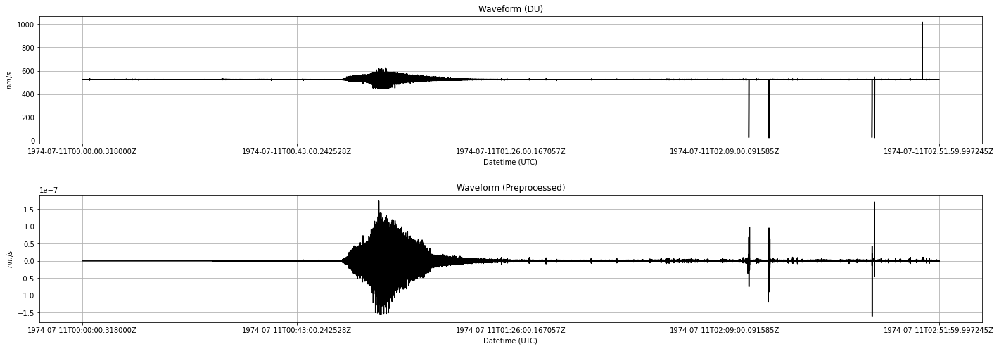

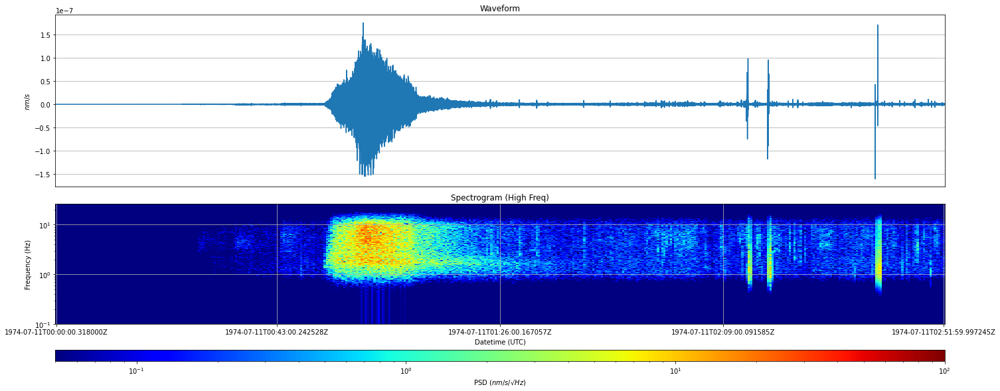

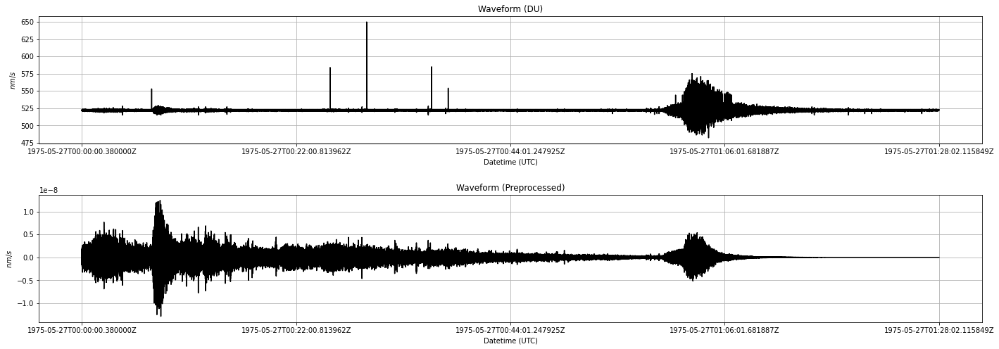

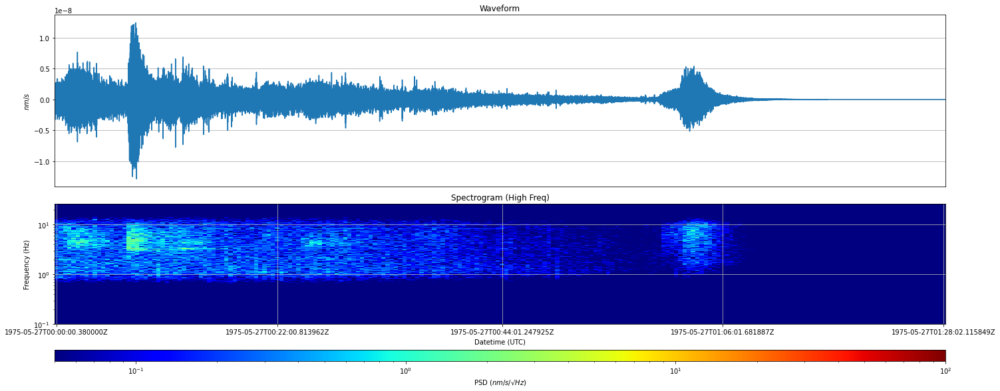

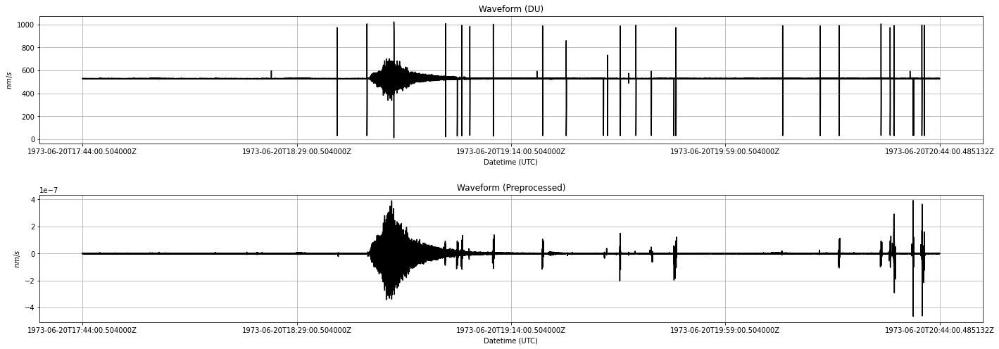

...

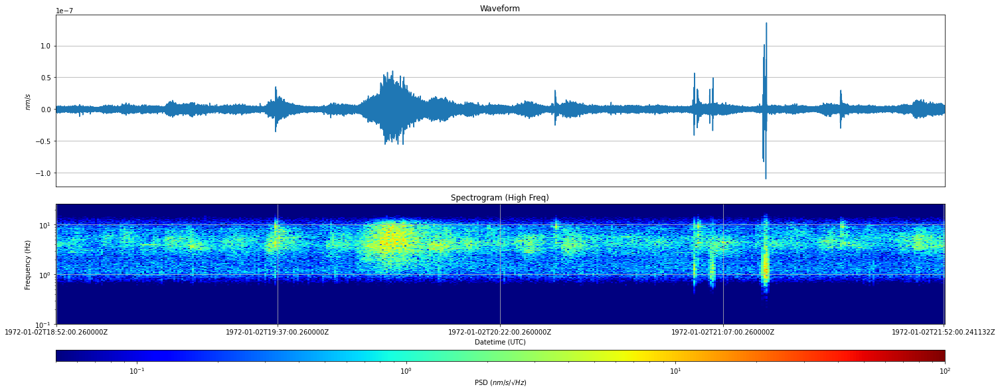

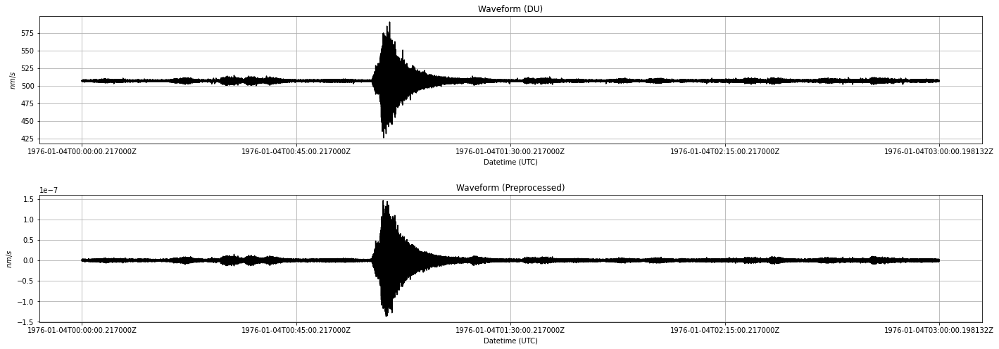

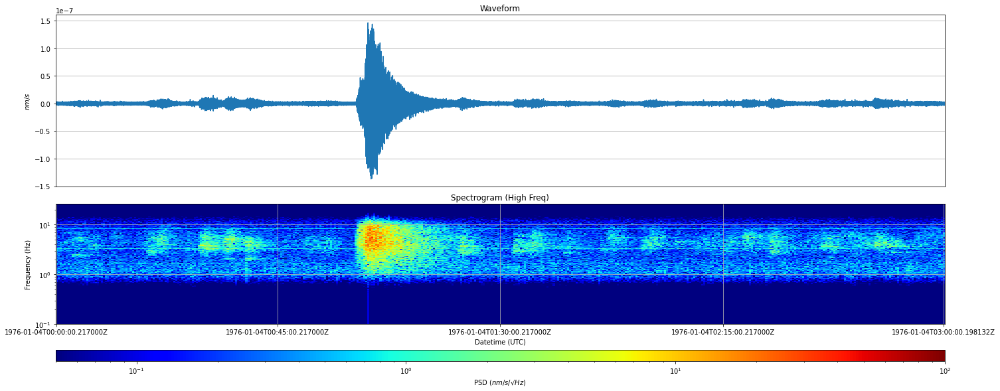

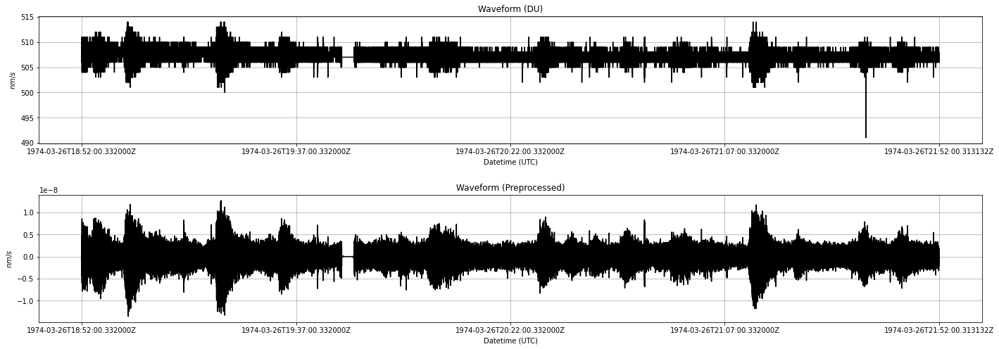

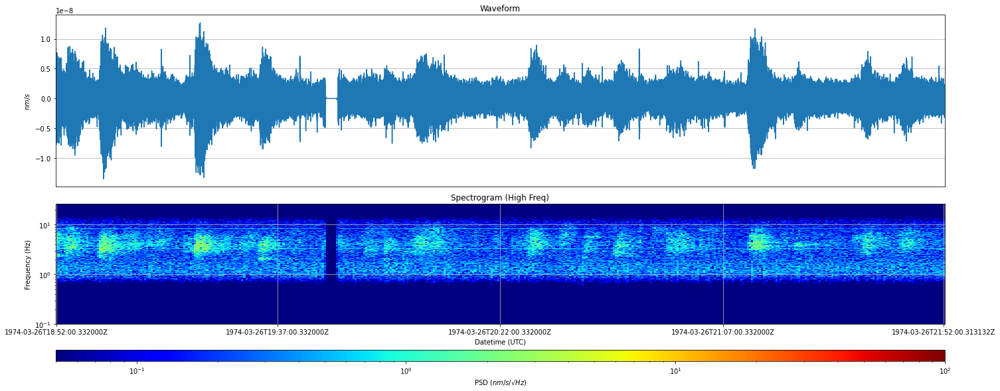

In [2]:
dir_name = 'plots_2022-06-26'
method = 'envelope'

with open('/Users/imagawa/Downloads/HFT_datetime.json') as f:
    d = json.load(f) # dict[event_id, datetime]

files = glob(f'/Users/imagawa/Desktop/実験データ/HFT_plots/plots_2022-06-14/{method}/pickle/**/*')

for file in files:
    suffix = file[-26:-7]
    print('\n' + '=' * 10)
    print(f'{method}: /{suffix}')
    
    with open(file, 'rb') as f:
        smq = pickle.load(f)
    
    key = '/'.join(file.split('/')[-2:])[:-7]
    hft_dt = datetime.datetime.strptime(d[key], '%Y-%m-%d %H:%M')

    start = hft_dt - datetime.timedelta(hours=1)
    end = hft_dt + datetime.timedelta(hours=2)

    smq.trim(
        start=[start.year, start.month, start.day, start.hour, start.minute],
        end=[end.year, end.month, end.day, end.hour, end.minute],
        with_du=True,
    )
    smq.plot_du(
        save=True,
        path=f'./{dir_name}/DU/{suffix}/',
    )
    smq.plot_comparison_with_du(
        'SPZ',
        save=True,
        path=f'./{dir_name}/{method}/comparison/{suffix}/',
    )
    smq.plot_spectrogram(
        'SPZ',
        save=True,
        path=f'./{dir_name}/{method}/spectrogram/{suffix}/',
    )
    os.makedirs(f'./{dir_name}/{method}/pickle/{suffix[:4]}/', exist_ok=True)
    with open(f'./{dir_name}/{method}/pickle/{suffix}.pickle', 'wb') as p:
        pickle.dump(smq, p) # Save a pickle file

In [3]:
dir_name = 'plots_2022-06-26'
method = 'ewm'

with open('/Users/imagawa/Downloads/HFT_datetime.json') as f:
    d = json.load(f) # dict[event_id, datetime]

files = glob(f'/Users/imagawa/Desktop/実験データ/HFT_plots/plots_2022-06-14/{method}/pickle/**/*')

for file in files:
    suffix = file[-26:-7]
    print('\n' + '=' * 10)
    print(f'{method}: /{suffix}')
    
    with open(file, 'rb') as f:
        smq = pickle.load(f)
    
    key = '/'.join(file.split('/')[-2:])[:-7]
    hft_dt = datetime.datetime.strptime(d[key], '%Y-%m-%d %H:%M')

    start = hft_dt - datetime.timedelta(hours=1)
    end = hft_dt + datetime.timedelta(hours=2)

    smq.trim(
        start=[start.year, start.month, start.day, start.hour, start.minute],
        end=[end.year, end.month, end.day, end.hour, end.minute],
        with_du=True,
    )
    smq.plot_du(
        save=True,
        path=f'./{dir_name}/DU/{suffix}/',
    )
    smq.plot_comparison_with_du(
        'SPZ',
        save=True,
        path=f'./{dir_name}/{method}/comparison/{suffix}/',
    )
    smq.plot_spectrogram(
        'SPZ',
        save=True,
        path=f'./{dir_name}/{method}/spectrogram/{suffix}/',
    )
    os.makedirs(f'./{dir_name}/{method}/pickle/{suffix[:4]}/', exist_ok=True)
    with open(f'./{dir_name}/{method}/pickle/{suffix}.pickle', 'wb') as p:
        pickle.dump(smq, p) # Save a pickle file


ewm: /p14s/pse.a14.08.013


IndexError: boolean index did not match indexed array along dimension 0; dimension is 4579359 but corresponding boolean dimension is 4578359